In [1]:
import cv2
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import io
from numpy import reshape

## Q1A) Find Dominant Color in Image 
(In BGR Format)

In [2]:
def dominantColor(img):
    arr = reshape(img,(img.shape[0]*img.shape[1],3)).astype(float)
    uniqueValues, occurCount = np.unique(arr, return_counts=True, axis=0)
    zipped_pairs = zip(occurCount, uniqueValues) 
    z = [x for _, x in sorted(zipped_pairs, key=lambda pair: pair[0], reverse=True)]
    return z[0].astype(int)

In [3]:
img = cv2.imread('./input_data/fg.jpg')
a = dominantColor(img)
a

array([  8, 255,  21])

## Q1B) Merge Foreground and Background

In [4]:
def mergeImage(img, bg):
# def replaceimg(fg, bg):
    arr = reshape(img,(img.shape[0]*img.shape[1],3)).astype(float)

    arr_bg = reshape(bg,(bg.shape[0]*bg.shape[1],3)).astype(float)
    domcol = dominantColor(img)
#     index = np.where(img == domcol)
    index = np.where(np.logical_or(img == domcol, img == np.asarray([domcol[0]+14, domcol[1]-1,domcol[2]-11]) ))
# index = np.where(np.logical_and(img >= np.asarray([domcol[0]-2, domcol[1]-1,domcol[2]-2]) ,img <=np.asarray([domcol[0]+2, domcol[1],domcol[2]+2])))
    coordinates = list(zip(index[0], index[1]))
    coordinates = np.unique(coordinates, axis=0).T
    fg_copy = img.copy()
    fg_copy[coordinates[0], coordinates[1]] = bg[coordinates[0], coordinates[1]]
    result = fg_copy.reshape(img.shape).astype('uint8')
    img = cv2.cvtColor(result, cv2.COLOR_BGR2RGB) 
    fig = plt.figure(figsize=(20,20))
    plt.axis("off")
    plt.imshow(img)

(720, 1280, 3)
(720, 1280, 3)


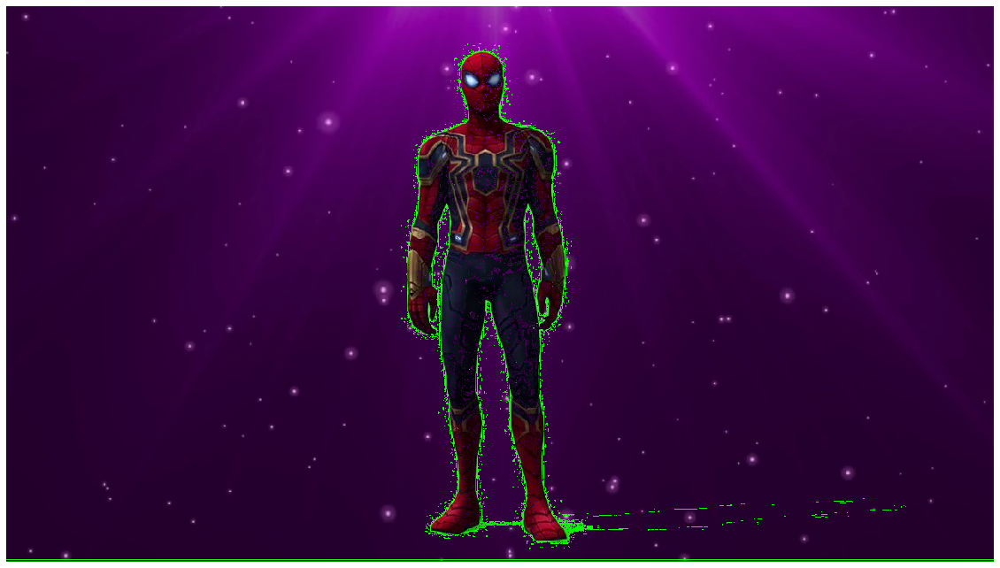

In [5]:
img = cv2.imread('./input_data/fg.jpg')
print(img.shape)
bg = cv2.imread('./input_data/bg.jpg')
print(bg.shape)
mergeImage(img, bg)

## Q1C) 

(720, 1280, 3)
(2955, 4433, 3)


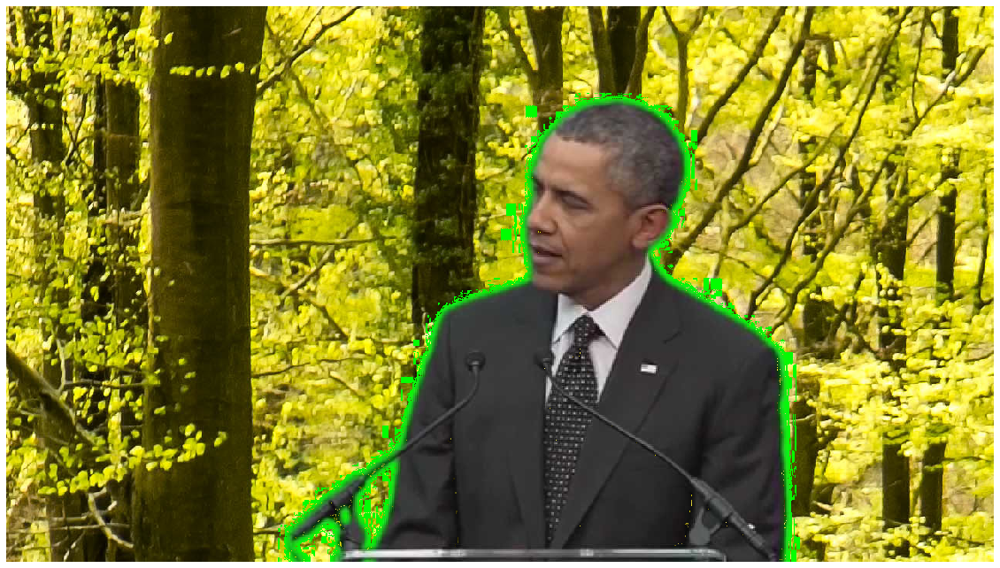

In [6]:
img = cv2.imread('./input_data/obamagreen.jpg')
bg = cv2.imread('./input_data/forest.jpeg')
# bg = cv2.resize(bg, (846,480))
print(img.shape)
print(bg.shape)
mergeImage(img, bg)

(1204, 2198, 3)
(2955, 4433, 3)


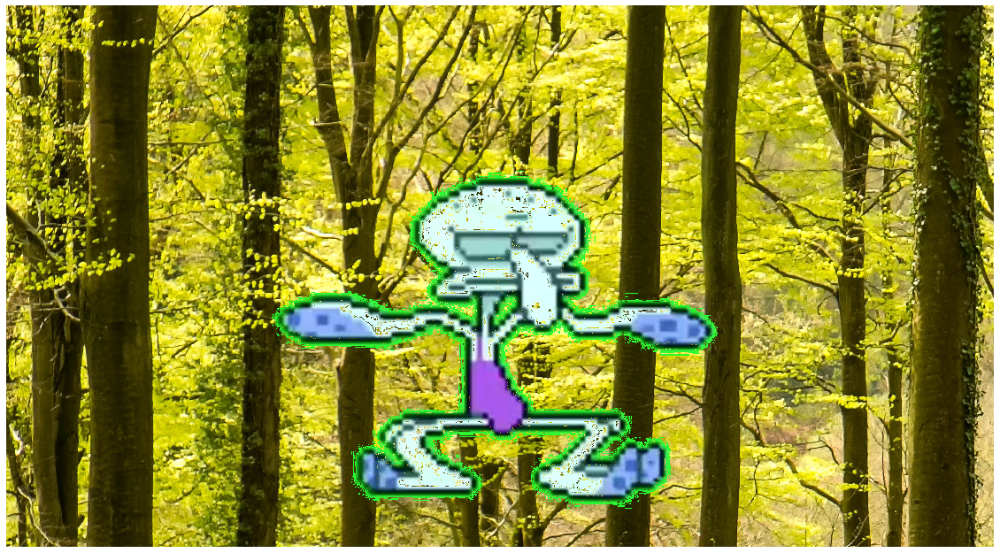

In [7]:
img = cv2.imread('./input_data/sqiudward.jpg')
bg = cv2.imread('./input_data/forest.jpeg')
# bg = cv2.resize(bg, (846,480))
print(img.shape)
print(bg.shape)
mergeImage(img, bg)

## Q2A) Linear Contrast Stretching

In [8]:
#Write a program to enhance the low contrast image to high contrast image using linear stretching method.

import cv2
import numpy as np
from matplotlib import pyplot as plt

def linContrastStretching(im, a ,b):
    image = cv2.imread(im,cv2.COLOR_BGR2GRAY)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    cv2.imshow("Input", image)
    cv2.waitKey(0)
#     print(image)
    image = image - a
    image = (image * (255/(b - a)))
#     result = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    cv2.imshow("Output", image.astype("uint8"))
    cv2.waitKey(0)
    cv2.destroyAllWindows()
    return image

In [9]:
arr = linContrastStretching("./input_data/Hawkes.jpg", 117, 200)

## Q2B) COLORBAR (k most frequent colors)

In [10]:
def kColors(img, k):
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 
    arr = reshape(img,(1,np.product(img.shape))).astype(float)
    uniqueValues, occurCount = np.unique(arr[0] ,return_counts=True, axis=0)
    z = [x for _,x in sorted(zip(occurCount, uniqueValues), reverse=True)]
#     print(dict(zip(occurCount, uniqueValues)))
    z = np.asarray(z)
    palette = z[0:k]
    bar = np.zeros((50, k * 50, 3), dtype = "uint8")
    startX = 0
    endX = 0
    for x in palette:
        endX = endX + 50
        cv2.rectangle(bar, (startX, 0), (endX, 50), (int(x),int(x),int(x)), -1)
        startX = endX
    plt.axis("off")
    plt.imshow(bar)
    return z[0:k]

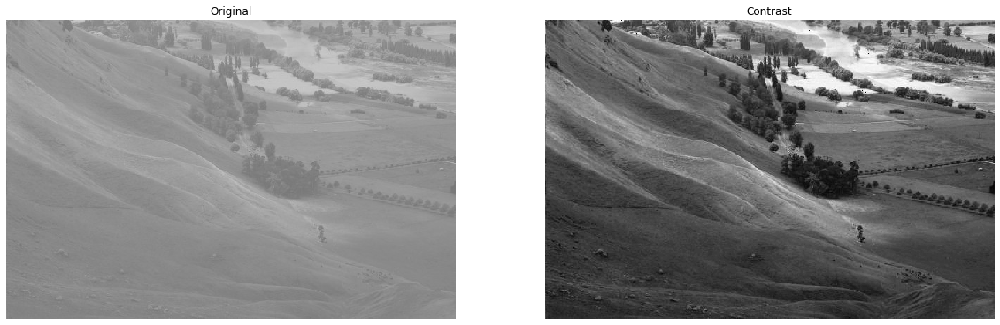

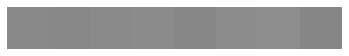

In [11]:
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(121, title = 'Original')
plt.axis("off")
plt.imshow((cv2.imread("./input_data/Hawkes.jpg")), cmap='gray')
ax2 = fig.add_subplot(122, title = 'Contrast')
plt.imshow(arr.astype("uint8"), cmap='gray')
   
plt.axis("off")
plt.show()
palette = kColors(cv2.imread('./input_data/Hawkes.jpg'), 8).astype("uint8")

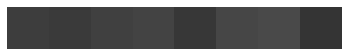

In [12]:
abd = kColors((arr.astype("uint8")), 8).astype("uint8")

Clearly, after performing linear contrast stretching, the resulting colorbar shows the most frequent colors as being way darker than the most frequent colors of the original image.
Contrast stretching attempts to improve an image by stretching the range of intensity values it contains to make full use of possible values. In the original image, there was not much use of darker pixel values. Unlike histogram equalization, contrast stretching is restricted to a linear mapping of input to output values.

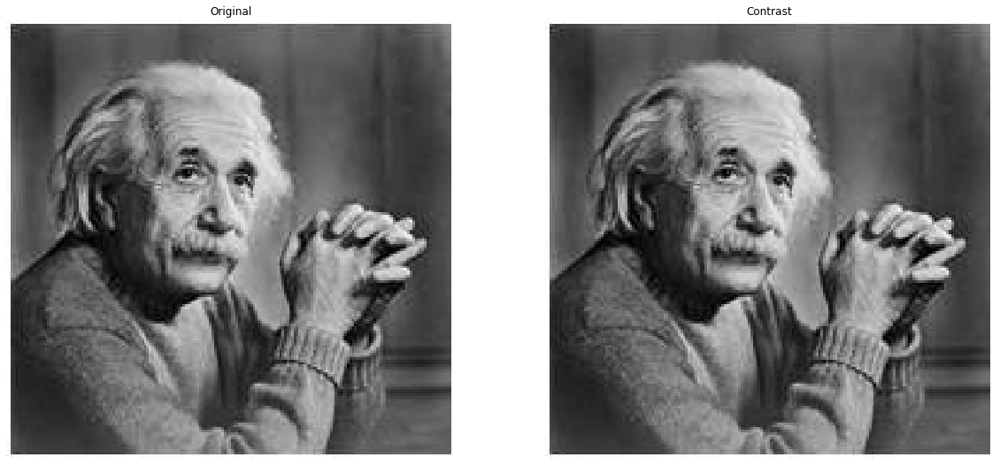

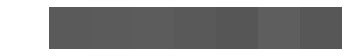

In [13]:
einie = linContrastStretching("./input_data/einstein.jpg", 0, 256)
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(121, title = 'Original')
plt.axis("off")
plt.imshow((cv2.imread("./input_data/einstein.jpg")), cmap='gray')
ax2 = fig.add_subplot(122, title = 'Contrast')
plt.imshow(einie.astype("uint8"), cmap='gray')
   
plt.axis("off")
plt.show()
palette = kColors(cv2.imread('./input_data/einstein.jpg'), 8).astype("uint8")

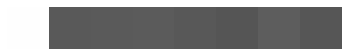

In [14]:
meenie = kColors((einie.astype("uint8")), 8).astype("uint8")

There's not much difference, as the image is already pretty much distributed over the values 0 - 255 and thus, contrasting will not make the image differ by much.

## Q3A) Bit Quantize Images

In [15]:
from numpy import reshape

def BitQuantizeImage(im, k):
    img = cv2.imread(im)
    arr = reshape(img,(img.shape[0]*img.shape[1],3))
#     
    arr = arr>>(8-k)
    arr = arr<<(8-k)
    image = arr.reshape(img.shape).astype('uint8')
    cv2.imshow("Output", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()
#     result = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     plt.axis("off")
#     plt.imshow(result)
    return image

In [16]:
bqi = BitQuantizeImage("./input_data/quantize.jpg", 2)

## Q3B) Bit Plane Slicing

In [17]:
from scipy import misc
import matplotlib 
def sliceyDicey(img, bit_plane):
    img = cv2.imread(img)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     print(img)
    shape = img.shape
    
    b_bits = np.unpackbits(img)
    b_bits = b_bits.reshape((shape)[0],(shape)[1],8)
    b_bits[:,:,:(8-bit_plane)] = 0  #making the rest 0
    
    b_aug = np.packbits(b_bits)
    b_aug = b_aug.reshape(shape)
    fig = plt.figure(figsize=(10,10))
    plt.axis("off")
    plt.imshow(b_aug, cmap = "gray")

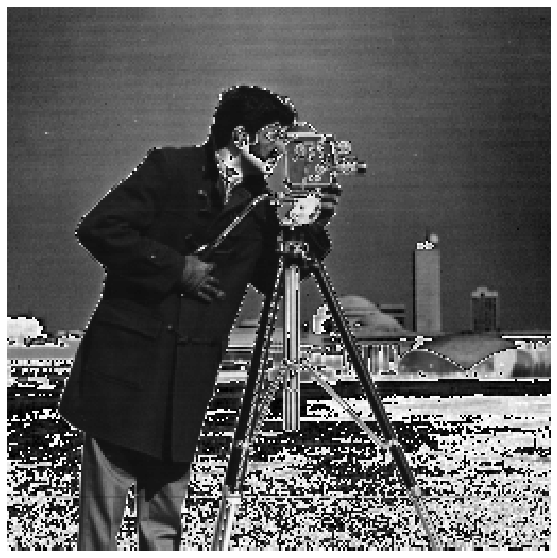

In [18]:
sliceyDicey("./input_data/cameraman.png", 7)

## Q3C) Operations on Lenna

### lena1.jpg : Bit Plane 5 slice

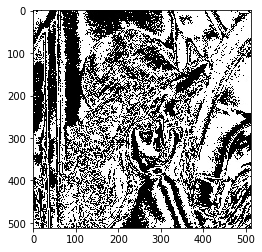

In [19]:
lena1 = cv2.imread("./input_data/lena1.jpg")
# sliceyDicey("./DIP_2019_A1/lena.jpg", 5)
plt.imshow(lena1)


### lena2.jpg : Quantization 2

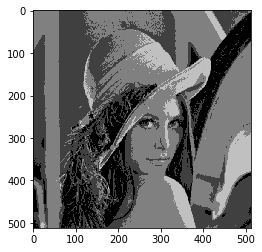

In [20]:
lena2 = cv2.imread("./input_data/lena2.jpg")
plt.imshow(lena2)
# bqilena = BitQuantizeImage("./DIP_2019_A1/lena2.jpg", 2)
# plt.imshow(bqilena)

## lena3.jpg : Quant 1 + Enhance Contrast

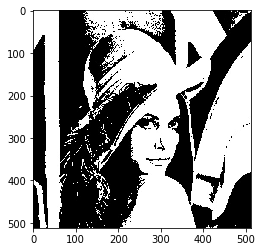

In [21]:
lena3 = cv2.imread("./input_data/lena3.jpg")
plt.imshow(lena3)
bqilena3 = BitQuantizeImage("./input_data/lena.jpg", 1)

# Intensity Transformation

## Q4A) Negative of an Image

In [22]:
import cv2
from matplotlib import pyplot as plt
import numpy as np

def createNeg(img, k):
#     img = cv2.imread(img,cv2.COLOR_BGR2GRAY)
    result = k - img
    cv2.imshow("Output", result)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [23]:
lena = BitQuantizeImage("./input_data/lena.jpg", 1)
createNeg(lena, np.amax(lena))

## Q4B) Gamma Transformation

In [24]:
def gammaTransform(gam, gamma):
#     gam = cv2.imread(gam)
    gam_yolo = pow(gam / 255.0, gamma) * 255.0
    fig = plt.figure(figsize=(10,10))
    plt.axis("off")
    plt.imshow(gam_yolo.astype("uint8"), cmap='gray')
    return gam_yolo.astype("uint8")
#     cv2.imshow("Output", gam_yolo.astype("uint8"))
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

array([[[227, 227, 227],
        [227, 227, 227],
        [226, 226, 226],
        ...,
        [231, 231, 231],
        [231, 231, 231],
        [231, 231, 231]],

       [[227, 227, 227],
        [226, 226, 226],
        [226, 226, 226],
        ...,
        [232, 232, 232],
        [231, 231, 231],
        [231, 231, 231]],

       [[227, 227, 227],
        [226, 226, 226],
        [226, 226, 226],
        ...,
        [231, 231, 231],
        [231, 231, 231],
        [230, 230, 230]],

       ...,

       [[145, 145, 145],
        [146, 146, 146],
        [147, 147, 147],
        ...,
        [122, 122, 122],
        [ 99,  99,  99],
        [ 67,  67,  67]],

       [[144, 144, 144],
        [142, 142, 142],
        [144, 144, 144],
        ...,
        [117, 117, 117],
        [ 93,  93,  93],
        [ 59,  59,  59]],

       [[142, 142, 142],
        [141, 141, 141],
        [141, 141, 141],
        ...,
        [115, 115, 115],
        [ 90,  90,  90],
        [ 73,  73,  73]]

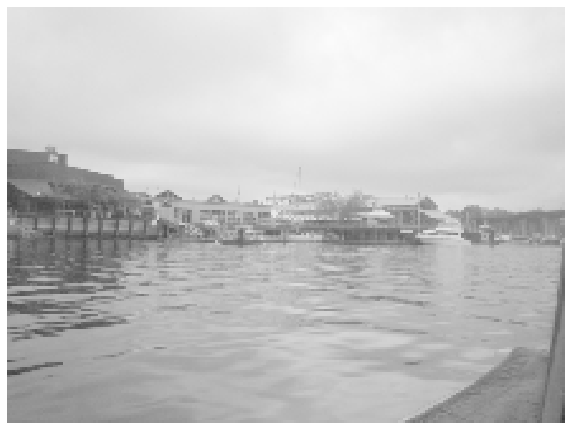

In [25]:
gammaTransform(cv2.imread("./input_data/gamma-corr.png"), 0.3)

## Q4C) Piecewise

In [26]:
def piecewiseLin(im, k1, k2, a, b):
    img = cv2.imread(im)
    for i in range(len(k1)):
        pixels = np.where(np.logical_and(a[i]<=(img/255.0), (img/255.0)<=b[i]))
        img[pixels] = k1[i] * img[pixels] + k2[i]*255
    plt.axis("off")
    plt.imshow(img.astype("uint8"))

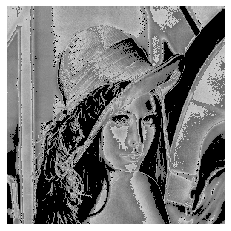

In [27]:
a_1 = [0, 0.3, 0.6, 0.8]
b_1 = [0.3, 0.6, 0.8, 1]
k1_1 = [0, 0.4 / 0.3, -2, 0]
k2_1 = [0, 0, 1, 0]
# a = [0, 0.3]
# b = [0.3, 0.6]
# k1 = [0, 0.4/0.3]
# k2 = [0, ]
piecewiseLin("./input_data/lena.jpg", k1_1,k2_1,a_1,b_1)

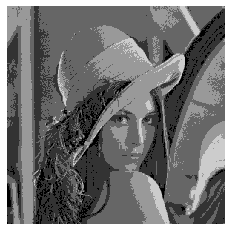

In [28]:
a_2 = [0, 0.2, 0.4, 0.6, 0.8]
b_2 = [0.2, 0.4, 0.6, 0.8, 1]
k1_2 = [0, 0, 0, 0, 0]
k2_2 = [0, 0.2, 0.4, 0.6, 0.8]

piecewiseLin("./input_data/lena.jpg", k1_2,k2_2,a_2,b_2)

## Q5A) Keeping the MSB bits in bitplane to 0:
####  This essentially means that we're slicing the MSB bit plane. MSB refers to the first bit on the right, and therefore means that every pixel's first value is 0. This would lead to the image being darker. For example, the binary equivalent of 162 is 10100010. If we set the first bit plane to zero, the number will become 34. Hence this adds to the darker colors' frequencies and thus results in the image being darker.

## Q5B) LSB bits in the bitplane to 0:
#### Since LSB bits implies the rightmost digit of a pixel binary value, changing it to 0 would imply toggling if it was a 1 before. However, this would not imply much change as the pixel value would only decrease by 1 and add to the previous colors' frequency. 

## Q5C) Calculating time to transmit

1 byte = 8 bit
1 packet = 8 + 1 + 1 bits = 10 bits

Image size = 512 * 512 pixels = 262144 pixels
Each pixel size = 8 bits

##### 56 K baud link:
1 kb = 1000 bits
56000 bits ------> 1sec
262144*8 bits----> ?sec

Ans : 37.44914285714286 seconds

##### 3000 K baud link:
3000000 bits -------> 1sec
262144*8 bits ------> ?sec

Ans: 0.699 seconds



In [29]:
2097152 / 3000000

0.6990506666666667

## Q6A) Histogram Equalization

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def histEqualization(im):
#     im = cv2.imread(im)
#     im = cv2.cvtColor(im, BGR2GRAY)
#     im = cv2.cvtColor(im, GRAY2BGR)
    flat = im.flatten()
    plt.hist(flat, bins=50)

    def frequency(im, bins):
        '''
            Create a frequency function
        '''
        freq_arr = np.zeros(bins)
        for i in im:
            freq_arr[i] = freq_arr[i] + 1

        return freq_arr
    
    # get frequency of pixels in image (Can be used to plot)
    hist = frequency(flat, 256)

    
    cumulative = np.cumsum(hist)
    upper = cumulative.max()
    lower = cumulative.min()


    # On normalizing frequencies obtained
    normalized = ((cumulative - lower) * 255)/ (upper - lower)

    result = normalized[flat]
    plt.hist(result, bins=50)
    

    result = np.reshape(result, im.shape)
    result = result.astype("uint8")
    fig = plt.figure(figsize=(20,20))

    ax1 = fig.add_subplot(121, title = 'Original')
    plt.axis("off")
    plt.imshow(im, cmap='gray')

    ax2 = fig.add_subplot(122, title = 'Equalized')
    plt.imshow(result, cmap='gray')
    
    plt.axis("off")
    plt.show()
    return result

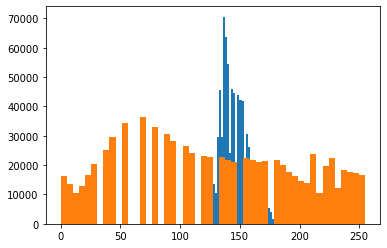

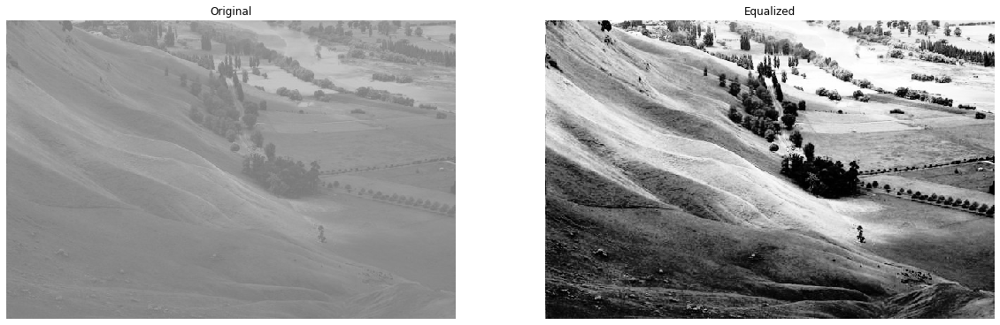

In [31]:
# print((cv2.imread('einstein.jpg')).shape)
# print((cv2.imread('Hawkes.jpg')).shape)
histeq = histEqualization(cv2.imread('./input_data/Hawkes.jpg'))

## Q6B)

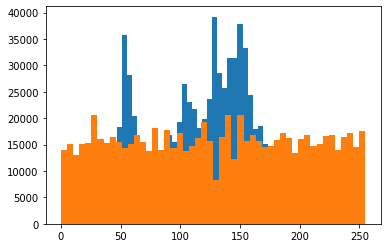

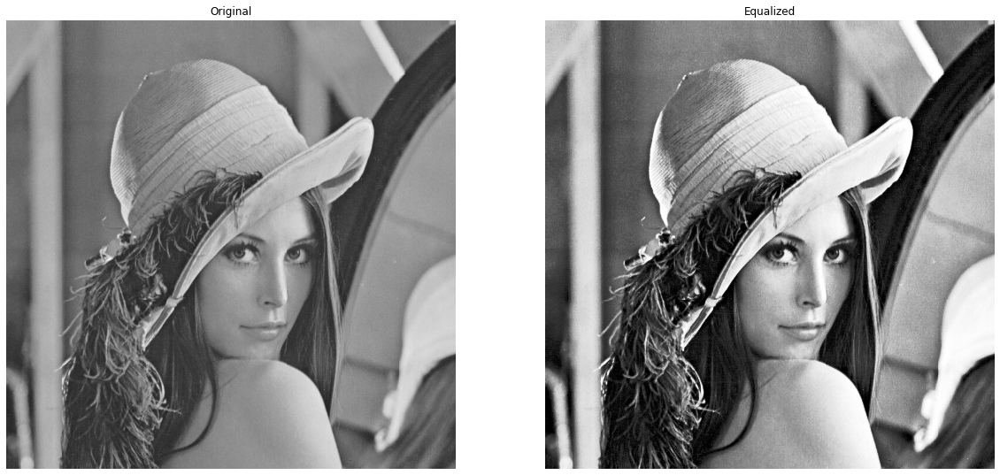

In [32]:
histeq = histEqualization(cv2.imread('./input_data/lena.jpg'))

Since most of lena image is light in color, and there's not much frequencies distributed to darker pixel values, the resulting image after hist equalization is seen to be darker.
This can be further observed din the histogram depicted where orange refers to histogram of the Equalized image

## Q6C) Histogram Matching

In [33]:
def cumsum(a):
    a = iter(a)
    b = [next(a)]
    for i in a:
        b.append(b[-1] + i)
    return np.array(b)

def histMatching(original, reference):
 
    shapie = original.shape
    
    # TURN INTO 1D TO COUNT FREQ.
    original = original.ravel()
    reference = reference.ravel()
     
    #CHECK PLOTS
    plt.hist(original, bins=50)
    plt.hist(reference, bins=50)
    
    #GET FREQ, INDICES, and COUNTS
    ogvalues, indices, ogcount = np.unique(original, return_inverse=True, return_counts=True)
    og_cumulative = cumsum(ogcount).astype(float)
    print(og_cumulative.max())
    total_sum = og_cumulative.max()
    og_cumulative = og_cumulative / total_sum
    
    # GET FREQ and COUNTS
    refvals, ref_count = np.unique(reference, return_counts=True)
    ref_cumulative = cumsum(ref_count).astype(float)
#     print(ref_cumulative.max())
    total_sum = ref_cumulative.max()
    ref_cumulative = ref_cumulative / total_sum
 
    # Round the values
    temp = np.around(ref_cumulative*255)
    
    # MAP VALS
    result=[]
    for data in (np.around(og_cumulative*255))[:]:
        closest = where_closest((np.around(ref_cumulative*255)),data)
        result.append(closest)
    result = np.array(result)
 
    return ((result[indices]).astype("uint8")).reshape(shapie)

def where_closest(arr, to_change):
    diff = arr - to_change
    # USE mask to mask values less than or equal to -1 (ie, the negative differences)
    shield = np.ma.less_equal(diff, -1)
    arraym = np.ma.masked_array(diff, shield)
    
    #SPECIAL CASE
    if np.all(shield):
        absol = np.abs(diff)
        c = absol.argmin()
        return c # min index (closest) iff target > all value
    
    return arraym.argmin()

1440000.0


(array([328396.,   7169.,      0.,      0.,   5737.,      0.,      0.,
             0.,      0.,      0.,      0.,      0.,      0.,      0.,
             0.,      0.,      0.,   4459.,      0.,   5426.,  12525.,
          8548.,  34569.,  56689.,  80660., 121737., 111220., 122229.,
        124259.,  97233.,  64237.,  59343.,  54707.,  45925.,  31074.,
         23947.,  14240.,   5140.,      0.,   6156.,      0.,   5571.,
             0.,      0.,   5916.,      0.,      0.,      0.,      0.,
          2888.]),
 array([  1.  ,   5.12,   9.24,  13.36,  17.48,  21.6 ,  25.72,  29.84,
         33.96,  38.08,  42.2 ,  46.32,  50.44,  54.56,  58.68,  62.8 ,
         66.92,  71.04,  75.16,  79.28,  83.4 ,  87.52,  91.64,  95.76,
         99.88, 104.  , 108.12, 112.24, 116.36, 120.48, 124.6 , 128.72,
        132.84, 136.96, 141.08, 145.2 , 149.32, 153.44, 157.56, 161.68,
        165.8 , 169.92, 174.04, 178.16, 182.28, 186.4 , 190.52, 194.64,
        198.76, 202.88, 207.  ]),
 <a list of 50 Pat

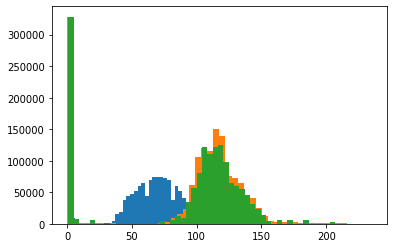

In [34]:
original = cv2.imread("./input_data/eye.png")
original = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
reference = cv2.imread("./input_data/eyeref.png")
reference = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)

a = histMatching(original, reference)
to_plot = a.ravel()
plt.hist(to_plot, bins=50)

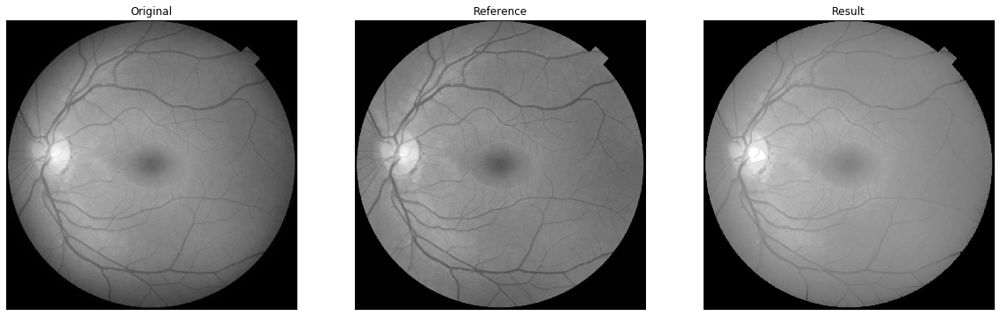

In [35]:
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(original, cmap='gray')

ax1 = fig.add_subplot(132, title = 'Reference')
plt.axis("off")
plt.imshow(reference, cmap='gray')

ax2 = fig.add_subplot(133, title = 'Result')

abc = (np.array(a)).astype("uint8")
plt.imshow(abc, cmap='gray')

plt.axis("off")
plt.show()

## Q6D) Canyon 
### Using the original image:

In [36]:
part1 = cv2.imread("./input_data/part1.png")
part1 = cv2.cvtColor(part1, cv2.COLOR_BGR2GRAY)

part2 = cv2.imread("./input_data/part2.png")
part2 = cv2.cvtColor(part2, cv2.COLOR_BGR2GRAY)

part3 = cv2.imread("./input_data/part3.png")
part3 = cv2.cvtColor(part3, cv2.COLOR_BGR2GRAY)

part4 = cv2.imread("./input_data/part4.png")
part4 = cv2.cvtColor(part4, cv2.COLOR_BGR2GRAY)

part4.shape

(174, 387)

In [37]:
canyon = cv2.imread("./input_data/canyon.png")
canyon = cv2.cvtColor(canyon, cv2.COLOR_BGR2RGB)
canyon = cv2.cvtColor(canyon, cv2.COLOR_RGB2GRAY)
canyon.shape

(348, 775)

67512.0


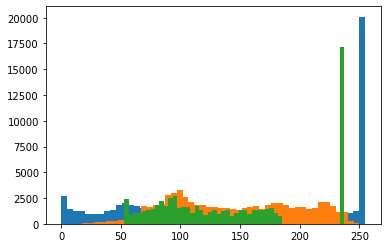

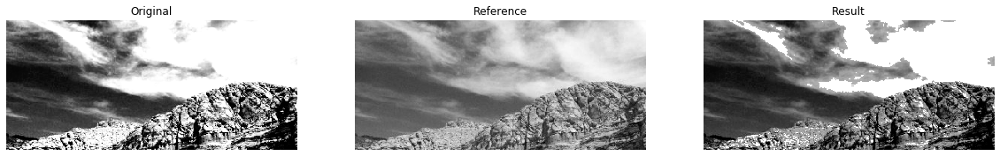

In [38]:
og_part1 = canyon[0:174, 0:388]
og_part1.shape

final_part1 = histMatching(part1, og_part1)

to_plot = final_part1.ravel()
plt.hist(to_plot, bins=50)
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(part1, cmap='gray')

ax1 = fig.add_subplot(132, title = 'Reference')
plt.axis("off")
plt.imshow(og_part1, cmap='gray')

ax2 = fig.add_subplot(133, title = 'Result')

abc = (np.array(a)).astype("uint8")
plt.imshow(final_part1, cmap='gray')

plt.axis("off")
plt.show()


67338.0
67512.0
67338.0


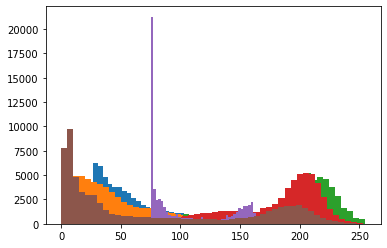

In [39]:
og_part2 = canyon[0:174, 388:]
og_part3 = canyon[174: , 0:388]
og_part4 = canyon[174: , 388: ]

final_part2 = histMatching(part2, og_part2)
final_part3 = histMatching(part3, og_part3)
final_part4 = histMatching(part4, og_part4)

In [40]:
up = np.concatenate((final_part1, final_part2), axis=1) #hori
down = np.concatenate((final_part3, final_part4), axis=1) #hori

vis = np.concatenate((up, down), axis=0) #vertical

cv2.imshow("Merged", vis)
cv2.waitKey(0)
cv2.destroyAllWindows()

## Q6D) Without using original

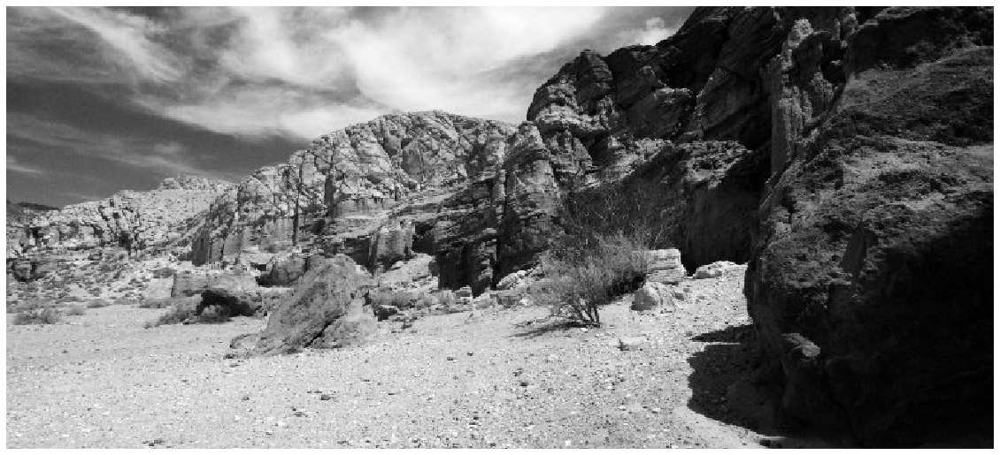

In [41]:
fig = plt.figure(figsize=(20,20))

# ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(canyon, cmap='gray')


67512.0
67338.0
67338.0


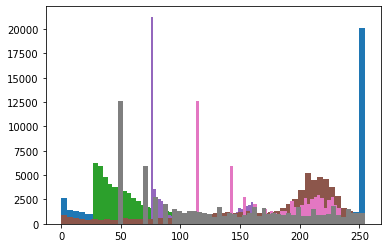

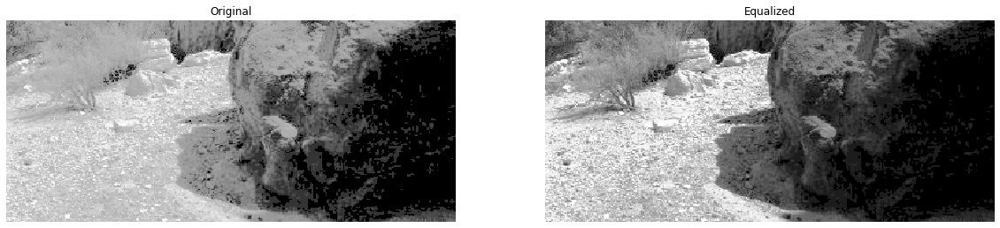

In [42]:
# part4 = gammaTransform(part4, 1)

final_part1 = histMatching(part1, part3)
final_part2 = histMatching(part2, part3)
final_part4 = histMatching(part4, part3)

final_part4 = histEqualization(final_part4)

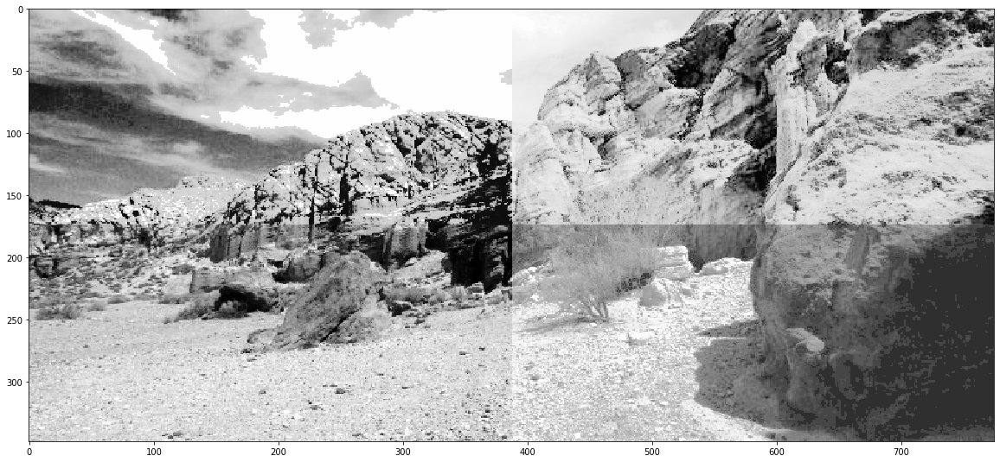

In [43]:
up = np.concatenate((final_part1, final_part2), axis=1) #hori
down = np.concatenate((part3, final_part4), axis=1) #hori

vis = np.concatenate((up, down), axis=0) #vertical

fig = plt.figure(figsize=(20,20))
plt.imshow(vis.astype("uint8"), cmap = "gray")

## Q7A) On applying HistEq twice:

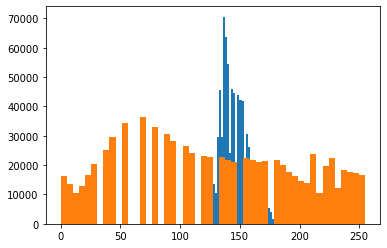

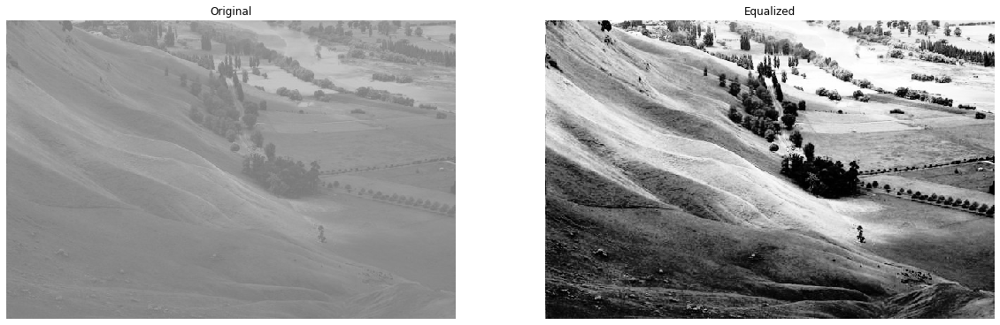

In [44]:
# print((cv2.imread('einstein.jpg')).shape)
# print((cv2.imread('Hawkes.jpg')).shape)
histeq = histEqualization(cv2.imread('./input_data/Hawkes.jpg'))

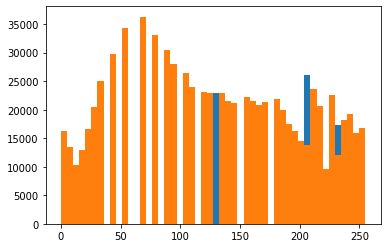

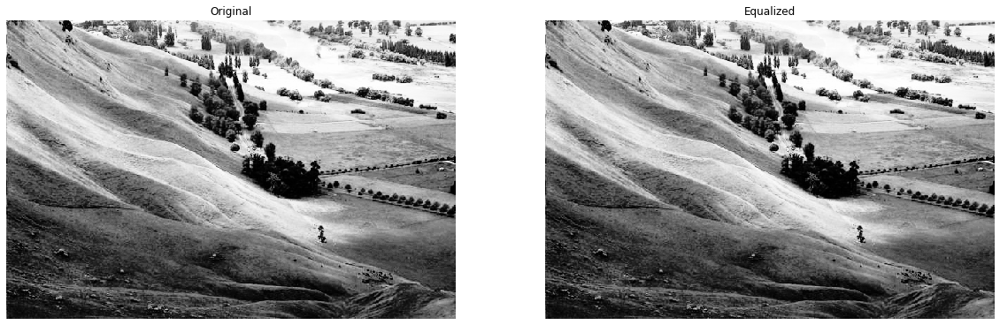

In [45]:
histeqtwice = histEqualization(histeq)

AS OBSERVED, the histogram nor the image changes by much. 
This is because a histogram equalization is idempotent. In other words, the value of the histogram equalization does not change when it is multiplied by itself. 

## Q7B) 
### Dark -> Light Histograms

50325.0


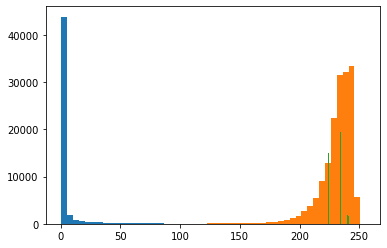

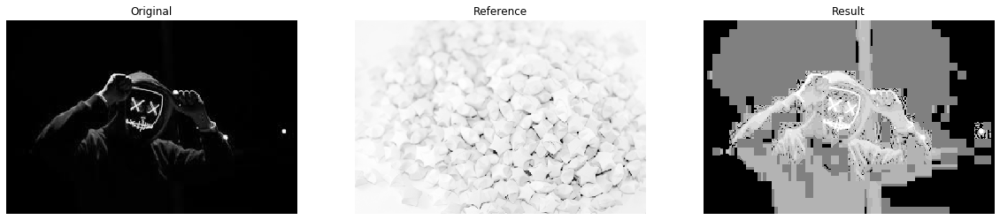

In [46]:
eenie = cv2.imread("./input_data/dark.jpeg")
eenie = cv2.cvtColor(eenie, cv2.COLOR_BGR2GRAY)
lenie = cv2.imread("./input_data/light.png")
lenie = cv2.cvtColor(lenie, cv2.COLOR_BGR2GRAY)
similar = histMatching(eenie, lenie)
to_plot = similar.ravel()
plt.hist(to_plot, bins = 50)
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(eenie, cmap='gray')

ax1 = fig.add_subplot(132, title = 'Reference')
plt.axis("off")
plt.imshow(lenie, cmap='gray')

ax2 = fig.add_subplot(133, title = 'Result')

abc = (np.array(a)).astype("uint8")
plt.imshow(similar, cmap='gray')

plt.axis("off")
plt.show()

### Light -> Dark Histograms

166500.0


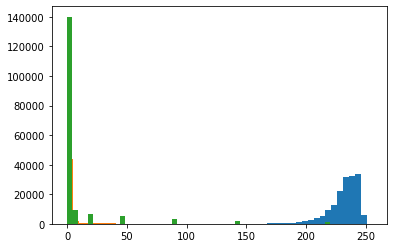

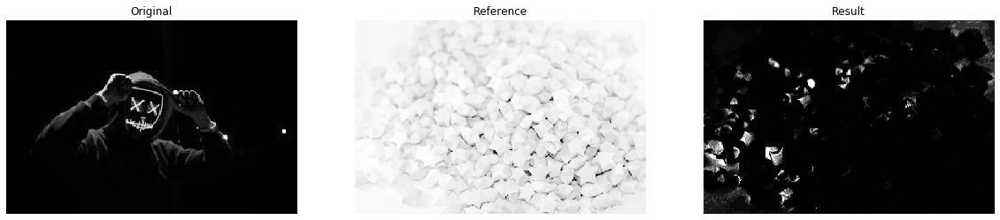

In [47]:
eenie = cv2.imread("./input_data/dark.jpeg")
eenie = cv2.cvtColor(eenie, cv2.COLOR_BGR2GRAY)

lenie = cv2.imread("./input_data/light.png")
lenie = cv2.cvtColor(lenie, cv2.COLOR_BGR2GRAY)
similar = histMatching(lenie, eenie)
to_plot = similar.ravel()
plt.hist(to_plot, bins = 50)
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(eenie, cmap='gray')

ax1 = fig.add_subplot(132, title = 'Reference')
plt.axis("off")
plt.imshow(lenie, cmap='gray')

ax2 = fig.add_subplot(133, title = 'Result')

abc = (np.array(a)).astype("uint8")
plt.imshow(similar, cmap='gray')

plt.axis("off")
plt.show()

## Similar histograms

1127100.0


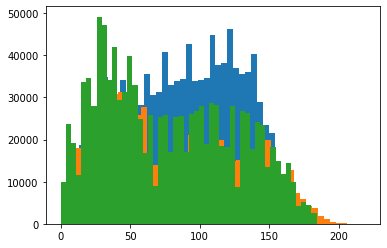

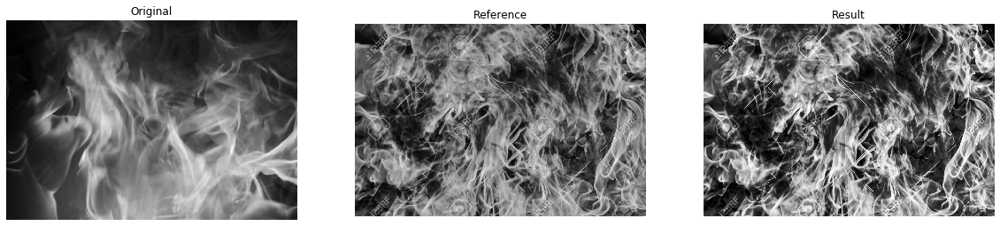

In [48]:
eenie = cv2.imread("./input_data/fire1.jpg")
eenie = cv2.cvtColor(eenie, cv2.COLOR_BGR2GRAY)
lenie = cv2.imread("./input_data/fire2.jpg")
lenie = cv2.cvtColor(lenie, cv2.COLOR_BGR2GRAY)
similar = histMatching(lenie, eenie)
to_plot = similar.ravel()
plt.hist(to_plot, bins = 50)
fig = plt.figure(figsize=(20,20))

ax1 = fig.add_subplot(131, title = 'Original')
plt.axis("off")
plt.imshow(eenie, cmap='gray')

ax1 = fig.add_subplot(132, title = 'Reference')
plt.axis("off")
plt.imshow(lenie, cmap='gray')

ax2 = fig.add_subplot(133, title = 'Result')

abc = (np.array(a)).astype("uint8")
plt.imshow(similar, cmap='gray')

plt.axis("off")
plt.show()